  0%|          | 0/647 [00:00<?, ?it/s]

/usr/local/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
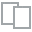
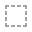
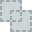
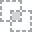
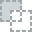
...
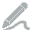
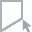
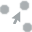
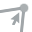
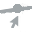

In [1]:
import pandas as pd
from dataprep.eda import create_report

path = "df_daily_aggregated.csv"
df = pd.read_csv(path)

df['date'] = pd.to_datetime(df['date'])

df.head()

report = create_report(df)
report


>>> Membuka: ts_ayam_potong_clean.csv
Kolom file: ['date', 'Ayam_Potong']
Contoh 5 baris:


,date,value
0,2024-01-01,0.000
1,2024-01-02,23.120
2,2024-01-03,12.760
3,2024-01-04,37.040
4,2024-01-05,53.675


  >> disimpan: /mnt/data/plots_ts/trend_Ayam_Potong.png


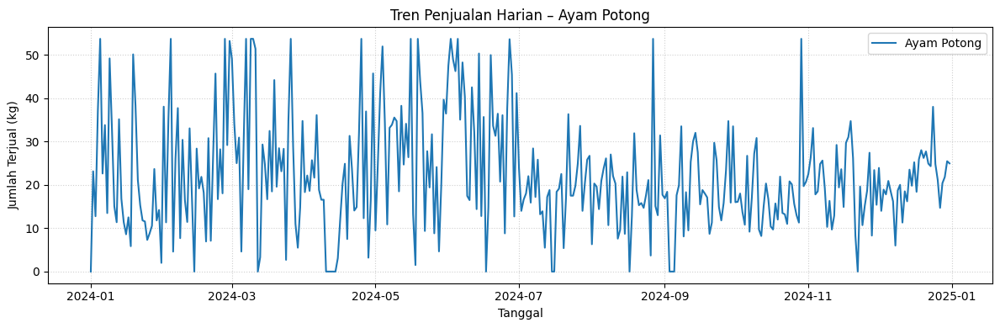


>>> Membuka: ts_ayam_kampung_clean.csv
Kolom file: ['date', 'Ayam_Kampung']
Contoh 5 baris:


,date,value
0,2024-01-01,0.00
1,2024-01-02,14.14
2,2024-01-03,16.40
3,2024-01-04,11.82
4,2024-01-05,0.00


  >> disimpan: /mnt/data/plots_ts/trend_Ayam_Kampung.png


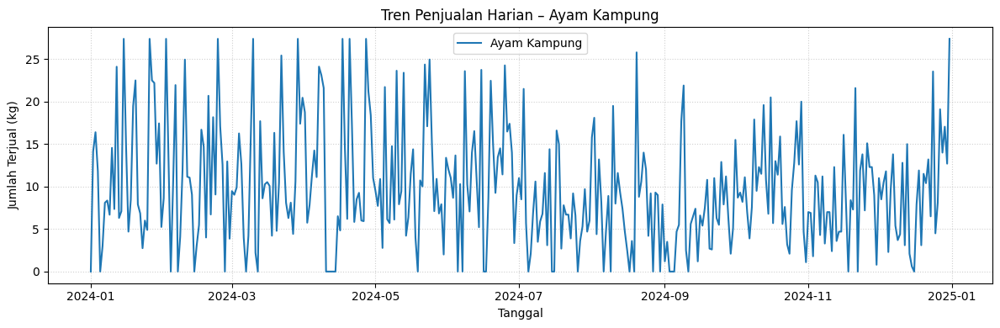


>>> Membuka: ts_ayam_tua_clean.csv
Kolom file: ['date', 'Ayam_Tua']
Contoh 5 baris:


,date,value
0,2024-01-01,0.00
1,2024-01-02,16.14
2,2024-01-03,5.20
3,2024-01-04,8.73
4,2024-01-05,9.69


  >> disimpan: /mnt/data/plots_ts/trend_Ayam_Tua.png


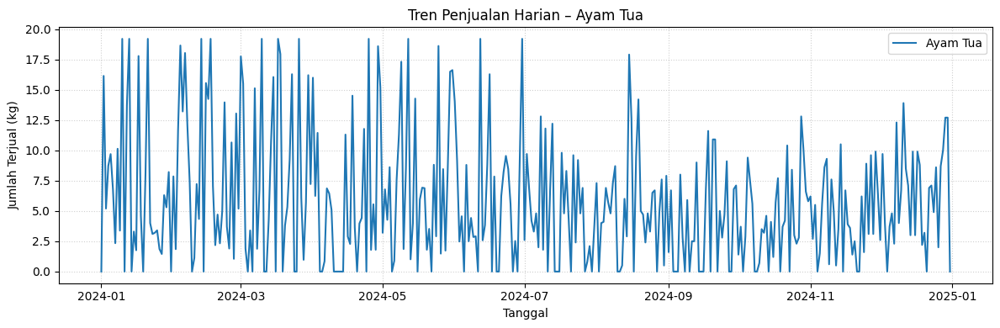


>>> Membuka: ts_ayam_potong_clean.csv
Kolom file: ['date', 'Ayam_Potong']
Contoh 5 baris:


,date,value
0,2024-01-01,0.000
1,2024-01-02,23.120
2,2024-01-03,12.760
3,2024-01-04,37.040
4,2024-01-05,53.675



>>> Membuka: ts_ayam_kampung_clean.csv
Kolom file: ['date', 'Ayam_Kampung']
Contoh 5 baris:


,date,value
0,2024-01-01,0.00
1,2024-01-02,14.14
2,2024-01-03,16.40
3,2024-01-04,11.82
4,2024-01-05,0.00



>>> Membuka: ts_ayam_tua_clean.csv
Kolom file: ['date', 'Ayam_Tua']
Contoh 5 baris:


,date,value
0,2024-01-01,0.00
1,2024-01-02,16.14
2,2024-01-03,5.20
3,2024-01-04,8.73
4,2024-01-05,9.69


>> Perbandingan disimpan: /mnt/data/plots_ts/trend_comparison_all.png


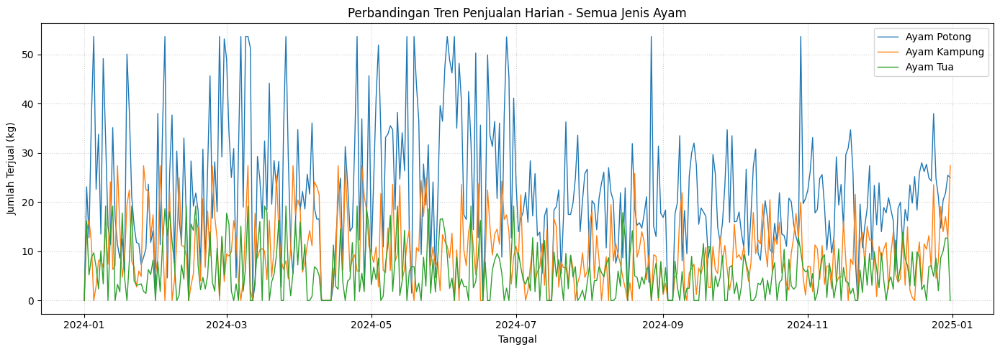


Selesai. File gambar (jika dibuat) ada di: /mnt/data/plots_ts


In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# -------------------------
# Config: file paths
# -------------------------
files = {
    "Ayam Potong": "ts_ayam_potong_clean.csv",
    "Ayam Kampung": "ts_ayam_kampung_clean.csv",
    "Ayam Tua": "ts_ayam_tua_clean.csv"
}

out_dir = "/mnt/data/plots_ts"   # jika ingin menyimpan gambar
os.makedirs(out_dir, exist_ok=True)

# -------------------------
# Utility: baca file dan cari kolom date + value
# -------------------------
def load_ts(filepath):
    """Baca CSV, cari kolom date dan kolom numeric value otomatis.
       Kembalikan DataFrame dengan kolom 'date' dan 'value'."""
    df = pd.read_csv(filepath)
    print(f"\n>>> Membuka: {filepath}")
    print("Kolom file:", list(df.columns))
    # Coba temukan kolom date
    date_col = None
    for cand in ['date','Date','tanggal','Tanggal','DATE']:
        if cand in df.columns:
            date_col = cand
            break
    if date_col is None:
        # cari kolom bertipe tanggal dengan heuristik: nama berisi 'date' atau 'tgl'
        for c in df.columns:
            if 'date' in c.lower() or 'tgl' in c.lower() or 'tanggal' in c.lower():
                date_col = c
                break

    # Jika belum ketemu, coba asumsikan kolom paling kiri adalah date jika is_string-like
    if date_col is None:
        first = df.columns[0]
        print(f"  >> Warning: kolom tanggal tidak jelas. Menggunakan kolom pertama: '{first}' sebagai tanggal.")
        date_col = first

    # konversi ke datetime (jika gagal, beri warning)
    try:
        df[date_col] = pd.to_datetime(df[date_col])
    except Exception as e:
        print(f"  >> Error konversi tanggal pada kolom '{date_col}': {e}")
        # coba parse dengan dayfirst=True sebagai fallback
        try:
            df[date_col] = pd.to_datetime(df[date_col], dayfirst=True, errors='coerce')
            print("  >> Konversi fallback dengan dayfirst=True (beberapa nilai mungkin NaT).")
        except:
            pass

    # cari kolom numeric nilai (exclude date_col)
    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    if date_col in numeric_cols:
        numeric_cols.remove(date_col)
    if len(numeric_cols) == 0:
        # coba konversi semua kolom kecuali date menjadi numeric lalu pilih yang berhasil paling banyak
        cand_cols = [c for c in df.columns if c != date_col]
        converted = {}
        for c in cand_cols:
            tmp = pd.to_numeric(df[c], errors='coerce')
            converted[c] = tmp.notna().sum()
        # pilih kolom dengan jumlah nilai numeric terbanyak
        best = max(converted, key=converted.get)
        print(f"  >> Tidak ada kolom numeric otomatis. Memilih kolom '{best}' (paling banyak nilai numeric).")
        df[best] = pd.to_numeric(df[best], errors='coerce').fillna(0)
        value_col = best
    else:
        # pilih kolom numeric pertama (umumnya ini kolom value)
        value_col = numeric_cols[0]

    # buat DataFrame standar
    df2 = df[[date_col, value_col]].copy()
    df2.columns = ['date', 'value']
    # pastikan sorted by date
    df2 = df2.sort_values('date').reset_index(drop=True)
    print("Contoh 5 baris:")
    display(df2.head(5))
    return df2

# -------------------------
# Plot function (terpisah)
# -------------------------
def plot_series(df_ts, title, save_path=None, show_ma=False, ma_window=7):
    plt.figure(figsize=(12,4))
    plt.plot(df_ts['date'], df_ts['value'], label=title, linewidth=1.5)
    if show_ma:
        df_ts['MA'] = df_ts['value'].rolling(ma_window, min_periods=1).mean()
        plt.plot(df_ts['date'], df_ts['MA'], linestyle='--', label=f"MA {ma_window} hari")
    plt.title(f"Tren Penjualan Harian – {title}")
    plt.xlabel("Tanggal")
    plt.ylabel("Jumlah Terjual (kg)")
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150)
        print(f"  >> disimpan: {save_path}")
    plt.show()
    plt.close()

# -------------------------
# Main: load & plot
# -------------------------
for name, path in files.items():
    if not os.path.exists(path):
        print(f"File tidak ditemukan: {path}  (lewati)")
        continue
    ts = load_ts(path)
    # Plot terpisah, tanpa MA secara default (set show_ma=True jika mau)
    savefile = os.path.join(out_dir, f"trend_{name.replace(' ','_')}.png")
    plot_series(ts, name, save_path=savefile, show_ma=False)

# -------------------------
# Jika mau: satu figure perbandingan (semua pada satu plot)
# -------------------------
# load semua ke dict untuk plot bersama (jika semua file ada)
series_dict = {}
for name, path in files.items():
    if os.path.exists(path):
        series_dict[name] = load_ts(path)

if len(series_dict) > 0:
    plt.figure(figsize=(14,5))
    for name, df_ts in series_dict.items():
        plt.plot(df_ts['date'], df_ts['value'], label=name, linewidth=1)
    plt.title("Perbandingan Tren Penjualan Harian - Semua Jenis Ayam")
    plt.xlabel("Tanggal")
    plt.ylabel("Jumlah Terjual (kg)")
    plt.legend()
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    out_compare = os.path.join(out_dir, "trend_comparison_all.png")
    plt.savefig(out_compare, dpi=150)
    print(f">> Perbandingan disimpan: {out_compare}")
    plt.show()

print("\nSelesai. File gambar (jika dibuat) ada di:", out_dir)
